# Convert A2D2 segmentation dataset to 2D object detection dataset

Import all essentials

In [28]:
from global_names import (A2D2_PATH, sensor_p, abs_)
import pickle, random, cv2, os, json, string, imagesize, copy
import numpy as np
from tqdm import tqdm
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from concurrent.futures import ThreadPoolExecutor
from PIL import Image
%matplotlib inline

with open("bm_ds.pkl", "rb") as f:
    bm_ds = pickle.load(f)

with open(os.path.join(A2D2_PATH, "camera_lidar_semantic/class_list.json"), 'rb') as f:
    class_list = json.load(f)
    
f = lambda x: int(x, 16)
rgb_int = lambda rgb_list: tuple([i for i in map(f, (rgb_list[1:3], rgb_list[3:5], rgb_list[5:7]))])
class_from_rgb = lambda rgb_list: list(class_list.values())[[list((int(i[1:3], 16), int(i[3:5], 16), int(i[5:7], 16))) for i in class_list.keys()].index(list(rgb_list))]
class_list_simplified = {k: (v[:-2] if v[-1] in string.digits else v) for k,v in class_list.items()}

## Time comparation (do not execute!)
**To convert segmentation maps into 2D bboxes use ./get_bboxes_a2d2.py script** (uses 16 threads!)

In [6]:
def run_iter(r_id):
    lab_p = abs_(sensor_p(r_id, "label"))
    mask_arr = cv2.cvtColor(cv2.imread(lab_p),cv2.COLOR_BGR2RGB)
    image_bboxes_dict = {i:[] for i in np.unique(list(class_list_simplified.values()))}
    for rgb_list, obj_class in class_list_simplified.items():
        binary_mask = np.where(np.prod(np.where(mask_arr == rgb_int(rgb_list), 255, 0), axis=-1) == 0, 0, 255).astype(np.uint8)
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        # xmin, xmax, ymin, ymax
        SIZE_LIMIT = 20
        image_bboxes_dict[obj_class] += [i for i in [[c[:,:,0].min(), c[:,:,0].max(), c[:,:,1].min(), c[:,:,1].max()] for i, c in enumerate(contours)] if i[1] - i[0] > SIZE_LIMIT and i[3] - i[2] > SIZE_LIMIT]
        all_bboxes[r_id] = image_bboxes_dict

In [7]:
all_ids = []
all_bboxes = {}
for i in bm_ds.values():
    all_ids += list(i)
# with ThreadPoolExecutor(16) as executor:
#     results = executor.map(run_iter, all_ids)

## Load pkl file after script execution

In [8]:
with open("all_bboxes_small.pkl", "rb") as write_file:
    all_bboxes = pickle.load(write_file)

## Filter classes

Create whitelist

In [9]:
filter_classes = lambda raw_labels, white_list: {k:v for k,v in raw_labels.items() if k in white_list}

white_list = """Bicycle
Car
Dashed line
Ego car
Irrelevant signs
Obstacles / trash
Pedestrian
Poles
Small vehicles
Solid line
Speed bumper
Tractor
Traffic guide obj.
Traffic sign
Traffic signal
Truck
Utility vehicle
Zebra crossing"""

white_list = white_list.split("\n")
print(white_list)

['Bicycle', 'Car', 'Dashed line', 'Ego car', 'Irrelevant signs', 'Obstacles / trash', 'Pedestrian', 'Poles', 'Small vehicles', 'Solid line', 'Speed bumper', 'Tractor', 'Traffic guide obj.', 'Traffic sign', 'Traffic signal', 'Truck', 'Utility vehicle', 'Zebra crossing']


## Create [yolov5 files structure](https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data)

In [10]:
path = os.path.join("..", "adod", "a2d2_od_dataset")
train = os.path.join("images", "train")
val = os.path.join("images", "val")
test = os.path.join("images", "test")
names = white_list
nc = len(white_list)

In [11]:
dataset_yaml_content = f"""\
path: {path}
train: {train}
val: {val}
test: {test}

nc: {nc}
names: {names}
"""
print(dataset_yaml_content)

path: ../adod/a2d2_od_dataset
train: images/train
val: images/val
test: images/test

nc: 18
names: ['Bicycle', 'Car', 'Dashed line', 'Ego car', 'Irrelevant signs', 'Obstacles / trash', 'Pedestrian', 'Poles', 'Small vehicles', 'Solid line', 'Speed bumper', 'Tractor', 'Traffic guide obj.', 'Traffic sign', 'Traffic signal', 'Truck', 'Utility vehicle', 'Zebra crossing']



In [12]:
if not os.path.exists(path):
    os.mkdir(path)

for p in [os.path.join(path, i) for i in (train, val, test)]:
    if not os.path.exists(p):
        os.makedirs(p, exist_ok=False)

In [13]:
with open("../yolov5/a2d2_od.yaml", "w") as f:
    f.write(dataset_yaml_content)

In [14]:
for p in [os.path.join(path, i) for i in (train, val, test)]:
    p = p.replace("images", "labels")
    if not os.path.exists(p):
        os.makedirs(p, exist_ok=False)

## Visualise result

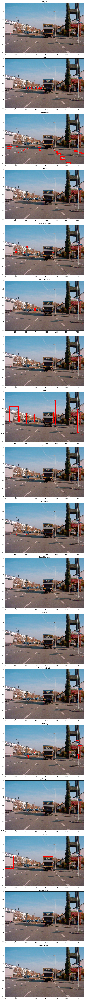

In [17]:
id_ = random.choice(list(all_bboxes.keys()))
presented_classes = [k for k,v in all_bboxes[id_].items() if len(v) > 0]
img_p = abs_(sensor_p(id_, "camera"))
image_arr = cv2.cvtColor(cv2.imread(img_p),cv2.COLOR_BGR2RGB)
fig, axes = plt.subplots(len(white_list),1, figsize=(10,6*len(white_list)))


for i, class_ in enumerate(white_list):
    ax = axes[i]
    ax.imshow(image_arr)

    for r in [i for i in  all_bboxes[id_][class_]]:
        rect = patches.Rectangle((r[0], r[2]), r[1]-r[0], r[3]-r[2], linewidth=3, edgecolor='r', facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)

    ax.set_title(class_)
plt.tight_layout()

## Create images symlinks

In [18]:
def create_symlink(object_path, symlink_path):
    os.symlink(object_path, symlink_path)

In [19]:
# create symlinks for images
for subset in ["train", "val", "test"]:
    for _id in bm_ds[subset + "_ids"]:
        object_path = abs_(sensor_p(_id, "camera"))
        symlink_path = os.path.join(path, "images", subset, _id + ".png")
        create_symlink(object_path, symlink_path)

## Create labels

Check if every image is the same size

In [21]:
image_w, image_h = imagesize.get(abs_(sensor_p(_id, "camera")))

Functionos to convert (xmin, xmax, ymin, ymax) format to [yolov5 format](https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data)

In [23]:
def all_bboxes_to_yolov5(all_):
    _yolov5 = copy.deepcopy(all_)
    for k,v in all_.items():
        if len(v) > 0:
            for i, old_coords in enumerate(v):
                xmin, xmax, ymin, ymax = old_coords
                X = (xmin + (xmax - xmin) // 2) / image_w
                Y = 1 - ((image_h - (ymin + (ymax - ymin) // 2)) / image_h)
                Width = (xmax - xmin) / image_w
                Height = (ymax - ymin) / image_h
                _yolov5[k][i] = [str(i)[:6] for i in [X, Y, Width, Height]]
    return _yolov5

def raw_labels_to_yolov5(raw_labels: dict):
    raw_labels = all_bboxes_to_yolov5(raw_labels)
    wierd_shit = [([str(list(raw_labels.keys()).index(k)) + "    "+ " ".join([str(i) for i in l]) for l in  v]) for k,v in raw_labels.items() if len(v) > 0]
    file_content = ""
    for i in wierd_shit:
        for j in i:
            file_content += j + "\n"
    # file_content = [[str(j) for j in i] for i in wierd_shit]
    return file_content

In [24]:
for subset in ["train", "val", "test"]:
    for _id in tqdm(bm_ds[subset + "_ids"]):
        raw_labels = all_bboxes[_id]
        filtered_labels = filter_classes(raw_labels, white_list)
        labels_file_path = os.path.join(path, "labels", subset, _id + ".txt")
        file_content = raw_labels_to_yolov5(filtered_labels)
        with open(labels_file_path, "w") as f:
            f.write(file_content)

100%|██████████| 5655/5655 [00:03<00:00, 1531.16it/s]


## Check the result

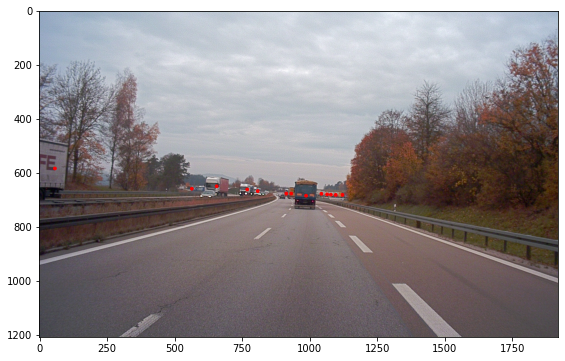

In [29]:
check_img_name = "20181108091945_camera_frontcenter_000076383.png"

check_id = [i for i in all_ids if "000076383" in i][0]

p_ = abs_(sensor_p(check_id, "camera"))

raw_labels =  all_bboxes[check_id]
filtered_labels = filter_classes(raw_labels, white_list)
file_content = raw_labels_to_yolov5(filtered_labels)

points = [(float(i.split(" ")[4]), float(i.split(" ")[5])) for i in file_content.split("\n") if i.startswith("15")]

fig, ax = plt.subplots(1,1,figsize=(10,6))
_ = ax.imshow(np.array(Image.open(p_)))
for X, Y in points:
    c = plt.Circle((X*image_w, Y*image_h), 5, color='r')
    ax.add_patch(c)

## Run yolov5 script

`python ../yolov5/train.py --img 640 --batch 16 --epochs 33 --data ../yolov5/a2d2_od.yaml --weights yolov5x.pt`

## Load model

In [3]:
%%time
!python ../yolov5/detect.py --weights ../yolov5/runs/train/exp8/weights/best.pt --source /home/g.leontiev/adod/a2d2_od_dataset/images/train/20181108091945_000076383_frontcenter.png

detect: weights=['../yolov5/runs/train/exp8/weights/best.pt'], source=/home/g.leontiev/adod/a2d2_od_dataset/images/train/20181108091945_000076383_frontcenter.png, data=../yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-268-g0c13240 Python-3.10.5 torch-1.11.0+cu102 CUDA:0 (Tesla V100-SXM2-32GB, 32510MiB)

Fusing layers... 
Model summary: 444 layers, 86287807 parameters, 0 gradients
image 1/1 /home/kamaz-files/camera_lidar_semantic/20181108_091945/camera/cam_front_center/20181108091945_camera_frontcenter_000076383.png: 416x640 4 Cars, 10 Dashed lines, 2 Solid lines, 7 Trucks, Done. (0.018s)
Speed: 0.7ms pre-process, 18.1ms inference, 2

## View predictions

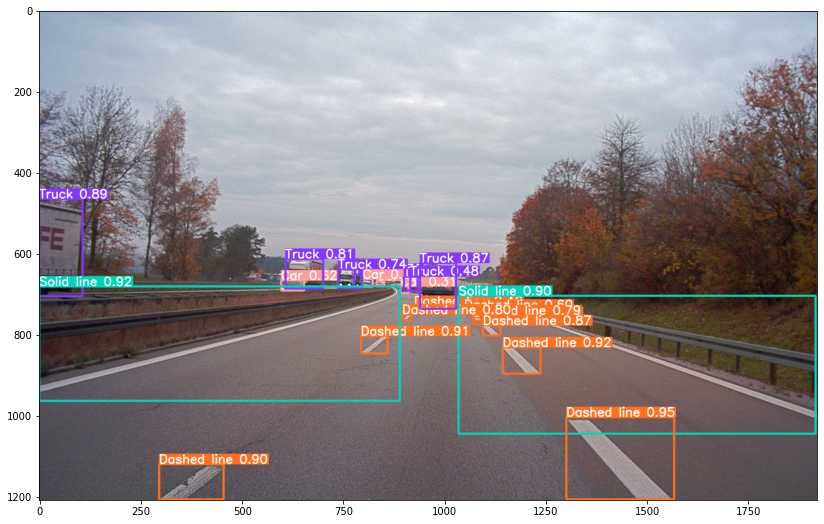

In [33]:
pred = np.array(Image.open("../yolov5/runs/detect/exp4/20181108091945_camera_frontcenter_000076383.png"))

fig, ax = plt.subplots(1,1,figsize=(15,9))
plt.imshow(pred)
plt.show()